# CMIP6 SSP Prediction

In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import os
import sys
import matplotlib.pyplot as plt
import pickle

In [3]:
# Add the folder to the Python path

os.chdir("../")
# change working directory to project's root path
print(os.getcwd())

folder_path = os.path.abspath("functions/") #INPUT_PATH)#'path_to_your_folder')  # Replace with the actual folder path
sys.path.insert(0, folder_path)

c:\Users\marti\Desktop\data\hw_extra


## Load cmip6 drivers

In [4]:
import tensorflow as tf
import os
import numpy as np
import random
import keras
import xarray as xr
SEED = 42

def set_seeds(seed=SEED):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    np.random.seed(seed)
    keras.utils.set_random_seed(seed)

def set_global_determinism(seed=SEED):
    set_seeds(seed=seed)

    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    
    tf.config.threading.set_inter_op_parallelism_threads(1)
    tf.config.threading.set_intra_op_parallelism_threads(1)

# Call the above function with seed value
set_global_determinism(seed=SEED)
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, LSTM, Dense, Dropout, GRU, Conv1D, Flatten, Reshape

In [5]:
from Predictions import (
    PredictionModel,
    SERA,
)
from indices import get_heatwaves_indices, transform_time_label

c:\Users\marti\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


## Load Data

### Drivers

In [6]:
path_drivers_ssp = "data/03_primary/drivers/dfs_dict_ssps.pickle"
with open(path_drivers_ssp, 'rb') as handle:
    cmip6_drivers_dfs = pickle.load(handle)

scenarios = list(cmip6_drivers_dfs["EC-Earth3"].keys())
cmip6_models = list(cmip6_drivers_dfs.keys())
print("Scenarios", scenarios)
print("Models", cmip6_models)

Scenarios ['historical', 'ssp126', 'ssp245', 'ssp370', 'ssp585']
Models ['MPI-ESM1-2-HR', 'MRI-ESM2-0', 'GFDL-ESM4', 'EC-Earth3', 'MIROC6', 'AWI-CM-1-1-MR', 'INM-CM4-8', 'ensemble_mean']


In [7]:
path_drivers_historical = "data/03_primary/drivers/dfs_dict.pickle"
with open(path_drivers_historical, 'rb') as handle:
    historical_dfs = pickle.load(handle)

In [8]:
hws_chile = pd.read_csv("data/local_data/monthly/hws_chile_new_agg.csv")

hws_chile["time"] = pd.to_datetime(hws_chile["Unnamed: 0"],format='%Y-%m')
hws_chile.set_index('time', inplace=True)
hws_chile.drop(columns="Unnamed: 0", inplace=True)
hws_chile = hws_chile[["hwn", "hwf", "hwd", "hwm", "hwa", "hwmeani"]]
hws_chile

,hwn,hwf,hwd,hwm,hwa,hwmeani
time,,,,,,
1971-01-01,0.0,0.0,0.0,0.000000,0.000000,0.000000
1971-02-01,0.2,0.7,4.0,2.155206,4.498967,7.543220
1971-03-01,0.0,0.0,0.0,0.000000,0.000000,0.000000
1971-04-01,0.2,0.6,3.0,3.185188,5.672930,9.555565
1971-05-01,0.1,0.3,3.0,5.556710,9.012540,16.670130
...,...,...,...,...,...,...
2023-08-01,0.3,1.0,4.0,2.786501,7.586745,9.288335
2023-09-01,0.0,0.0,0.0,0.000000,0.000000,0.000000
2023-10-01,0.1,0.3,3.0,0.627372,0.775687,1.882117


In [9]:
era5_df = pd.concat((historical_dfs["ERA5"],hws_chile),axis=1)
era5_df

,nino12,nino34,anom_wind_cl_raco,anom_wind_cl_puelche,anom_wind_pressure,anom_ta_cl,anom_pdo,anom_psl_sam_40,anom_psl_sam_65,anom_dmi_east,...,pressure,high_low_difference,adv_blob,adv_chile,hwn,hwf,hwd,hwm,hwa,hwmeani
time,,,,,,,,,,,,,,,,,,,,,
1971-01-01,-1.928113,-1.640253,0.006237,1.624297,-155.360306,1.249381,0.997573,-112.387703,341.377930,0.051705,...,102347.242188,-67.718750,-1.075192,5.139239,0.0,0.0,0.0,0.000000,0.000000,0.000000
1971-02-01,-2.979414,-1.713375,-0.288501,0.221068,-98.484497,-0.026722,0.767220,57.690361,51.769032,-0.038294,...,102348.992188,36.468750,0.878110,0.437056,0.2,0.7,4.0,2.155206,4.498967,7.543220
1971-03-01,-3.288180,-2.059431,-0.232439,0.302271,-77.386848,-0.150289,0.633572,6.743707,-146.034164,-0.249040,...,102237.007812,64.906250,-3.049048,-0.064510,0.0,0.0,0.0,0.000000,0.000000,0.000000
1971-04-01,-2.543985,-2.459558,-0.485039,-0.753484,198.601791,-0.788936,0.562198,-70.511070,233.869843,-0.472573,...,102222.132812,191.304688,0.137372,-0.576733,0.2,0.6,3.0,3.185188,5.672930,9.555565
1971-05-01,-1.714362,-2.507134,-0.089548,0.699281,185.134171,0.501217,0.420079,-178.369583,701.905396,-0.592277,...,102046.421875,49.265625,0.105984,-0.972252,0.1,0.3,3.0,5.556710,9.012540,16.670130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-01,2.723302,1.550383,1.282423,1.932909,-374.929413,2.065721,1.704082,-33.429050,154.142227,0.257379,...,102131.015625,-88.976562,-2.776886,-0.530017,0.3,1.0,4.0,2.786501,7.586745,9.288335
2023-09-01,2.123090,1.722627,0.850378,1.987928,-178.303970,1.922226,2.295783,29.182522,252.867569,0.023470,...,102677.593750,-98.132812,-0.182294,3.426786,0.0,0.0,0.0,0.000000,0.000000,0.000000
2023-10-01,1.840521,1.741871,-0.057451,-0.161683,24.046869,-0.402164,2.689852,312.206818,-144.109970,-0.294358,...,102781.796875,-85.257812,-1.519804,-1.120164,0.1,0.3,3.0,0.627372,0.775687,1.882117


### Station Detection

In [10]:
path_stations_detection = "data/03_primary/events/cmip6/"
stat_list = [
    "330007",
    "330020",
    "330030",
    "340031",
    "360011",
    "360019",
    "380013",
    "390006",
    "400009",
    "410005",
]
hw_model_scenario_station_df = {
    model: {
        scenario: {
            station: xr.open_dataset(f"{path_stations_detection}/{model}/{scenario}/station_detection/{station}/default.nc").to_dataframe() for station in stat_list
        } for scenario in scenarios
    } for model in cmip6_models[:-1]
}

In [11]:
hws_chile_model_scenario_yearly = {}
indices = ("hwn", "hwf", "hwd", "hwm", "hwa", "hwmeand", "hwi", "hwmaxi", "hwmeani")
for model_name, dict_scenarios in hw_model_scenario_station_df.items():
    scenario_stat_hws = {}
    for scenario, dict_stations in dict_scenarios.items():
        stations_indices = {}
        if scenario == "historical":
            target_years = (1970, 2014)
        else:
            target_years = (2015, 2100)

        # Get yearly indices for 10 stations
        for station_name, hw in dict_stations.items():
            stations_indices[station_name] = get_heatwaves_indices(hw, target_years, time_scale="year")

        # Concat stations indices
        hws_all_stats = pd.concat(list(stations_indices.values()), axis=1)
        hws_chile_df = pd.DataFrame(columns=indices, index=hws_all_stats.index)

        for index in indices:
            if index in ["hwn", "hwf", "hwi"]:
                hws_chile_df[index] = hws_all_stats[index].mean(axis=1)
            elif index in ["hwd", "hwa", "hwmaxi"]:
                hws_chile_df[index] = hws_all_stats[index].max(axis=1)
            elif index == "hwmeand":
                hws_chile_df[index] = hws_all_stats["hwf"].sum(axis=1) / hws_all_stats["hwn"].sum(axis=1)
            elif index == "hwm":
                hws_chile_df[index] = hws_all_stats["hwi"].sum(axis=1) / hws_all_stats["hwf"].sum(axis=1)
            elif index == "hwmeani":
                hws_chile_df[index] = hws_all_stats["hwi"].sum(axis=1) / hws_all_stats["hwn"].sum(axis=1)

        hws_chile_df = hws_chile_df.fillna(0.0)
        scenario_stat_hws[scenario] = hws_chile_df
    hws_chile_model_scenario_yearly[model_name] = scenario_stat_hws

## Predict by season

In [12]:
indices_of_interest = list(hws_chile.columns)
bounds = (-1.1692892810242344, -0.30647585455315646, 3.0, 6.499969486244418)
loss_fn=SERA(bounds=bounds,T=100, initial_weight=0.1, fn="piecewise2")
models_scenario_predicted = {model: {} for model in cmip6_drivers_dfs.keys()}
seasons_label_scalers = {}

for i in range(1,13):
    df_season = era5_df[era5_df.index.month==i]
    cnn_rnn_model = Sequential([
            Conv1D(16, kernel_size=1, activation="relu", input_shape=(1, len(era5_df.columns) - len(indices_of_interest))),
            Reshape((1, 16)),  # Back to time dimension
            SimpleRNN(8, activation="tanh"),
            Dropout(0.1),
            Dense(len(indices_of_interest))
        ])
    pred = PredictionModel(df_season, i, indices_of_interest, cnn_rnn_model, name_regressor="CNNRNN16",loss_fn=loss_fn)
    seasons_label_scalers[i] = pred.label_scaler
    pred.compile_keras_model()
    
    y_train, y_pred_train = pred.train(5)
    for name, scenarios_df in cmip6_drivers_dfs.items():
        for scenario in scenarios:
            if i==1:
                models_scenario_predicted[name][scenario] = pd.DataFrame()
            df_target = scenarios_df[scenario][scenarios_df[scenario].index.month==i]
            if scenario == "historical":
                df_target = df_target[(df_target.index.year >=1970) & (df_target.index.year <= 2014)]
            else:
                df_target = df_target[(df_target.index.year >=2015) & (df_target.index.year <= 2100)]
            # df_target[indices_of_interest] = df_season[indices_of_interest]
            # Normalize cmip6 features for machine input
            target = pred.scaler_X.transform(df_target[pred.scaler_X.feature_names_in_])
            # Reshape for keras and predict
            predicted_normalized = pred.regressor.predict(pred.reshape_for_keras(target))
            # Transform back to original range
            predicted_real = pred.label_scaler.inverse_transform(predicted_normalized)
            predicted = pd.DataFrame(predicted_real).rename(columns={i: label for i,label in enumerate(indices_of_interest)})
            predicted["Date"] = df_target.index
            predicted.set_index("Date",inplace=True)
            models_scenario_predicted[name][scenario] = pd.concat((models_scenario_predicted[name][scenario],predicted),axis=0)
        


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 2ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 2ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 1ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 3ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 2ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 3ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 2ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 2ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 2ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 2ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 2ms/step


c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:551: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[self.labels] = self.label_scaler.fit_transform(data[self.labels])
c:\Users\marti\Desktop\data\hw_extra\functions\Predictions.py:554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[features] = self.scaler_X.transform(data[features])


3/3 [==============================] - 0s 5ms/step


### Build Mean Prediction of all models

In [13]:
mean_scenario = {}
for scenario in scenarios:
    temp_df = pd.DataFrame()
    for name, model_scenario in models_scenario_predicted.items():
        temp_df = pd.concat((temp_df, model_scenario[scenario]), axis=1)
        
    mean_scenario[scenario] = pd.DataFrame(columns=models_scenario_predicted["EC-Earth3"][scenario].columns,index=model_scenario[scenario].index)
    for col in np.unique(temp_df.columns):
        mean_scenario[scenario][col] = temp_df[col].mean(axis=1)
models_scenario_predicted["mean"] = mean_scenario
models_scenario_predicted["mean"]

{'historical':                  hwn       hwf       hwd       hwm       hwa   hwmeani
 Date                                                                  
 1970-01-01  0.520008  1.942251  5.016042  1.533658  4.561739  6.629771
 1971-01-01  0.574458  1.773658  4.055125  1.516724  5.290714  8.089988
 1972-01-01  0.494710  1.818286  3.857410  1.879418  4.402491  6.956883
 1973-01-01  0.716953  2.269806  3.168308  2.018842  4.584357  8.513539
 1974-01-01  0.578911  1.890202  3.705892  1.680238  4.411446  7.598640
 ...              ...       ...       ...       ...       ...       ...
 2010-12-01  0.254810  1.019080  3.042150  1.136522  2.646590  3.728751
 2011-12-01  0.296408  1.528413  3.814125  0.584253  1.917369  2.543399
 2012-12-01  0.227258  1.383239  3.927196  0.488590  2.105097  1.814572
 2013-12-01  0.311490  1.620973  3.921313  1.400311  3.424671  4.743798
 2014-12-01  0.254761  1.421823  3.702034  1.204761  3.088695  3.683472
 
 [540 rows x 6 columns],
 'ssp126':             

## Build yearly and decadal indices

In [14]:
for scenario in scenarios:
    models_scenario_predicted["mean"][scenario] = models_scenario_predicted["mean"][scenario].astype(np.float64)

In [15]:
models_predicted_yearly = {model: {} for model in models_scenario_predicted.keys()}
models_predicted_decadal = {model: {} for model in models_scenario_predicted.keys()}

for name, model_scenario in models_scenario_predicted.items():
    for scenario, df in model_scenario.items():
        
        models_predicted_yearly[name][scenario] = transform_time_label(df, "year")
        models_predicted_decadal[name][scenario] = transform_time_label(df, "decade")


## Heatwave Indices Visualization

### EC-Earth3

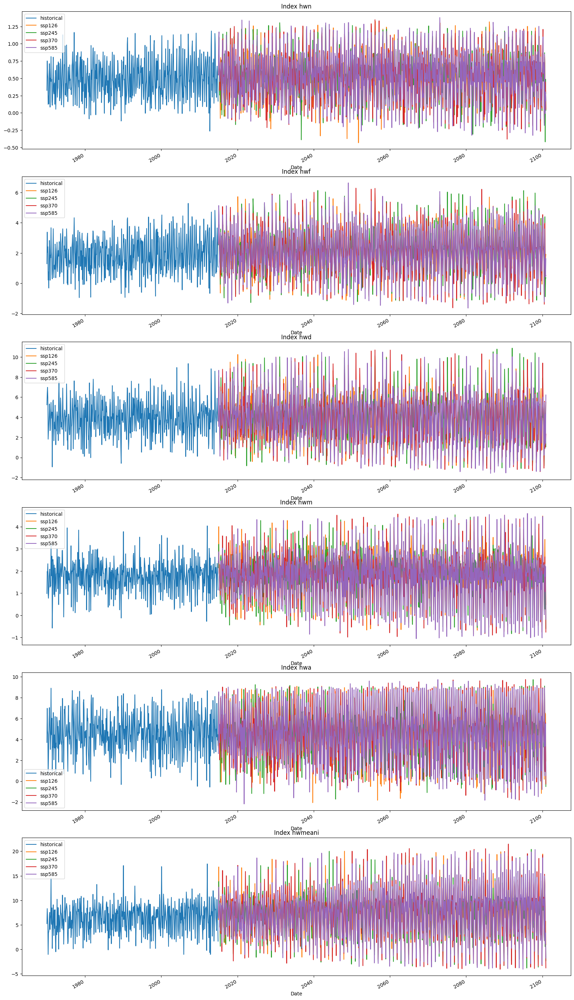

In [16]:
model = "EC-Earth3"
scenarios_prediction = models_scenario_predicted[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        df.plot(y=index, ax=axs[i], label=scenario)
    axs[i].set_title(f"Index {index}")

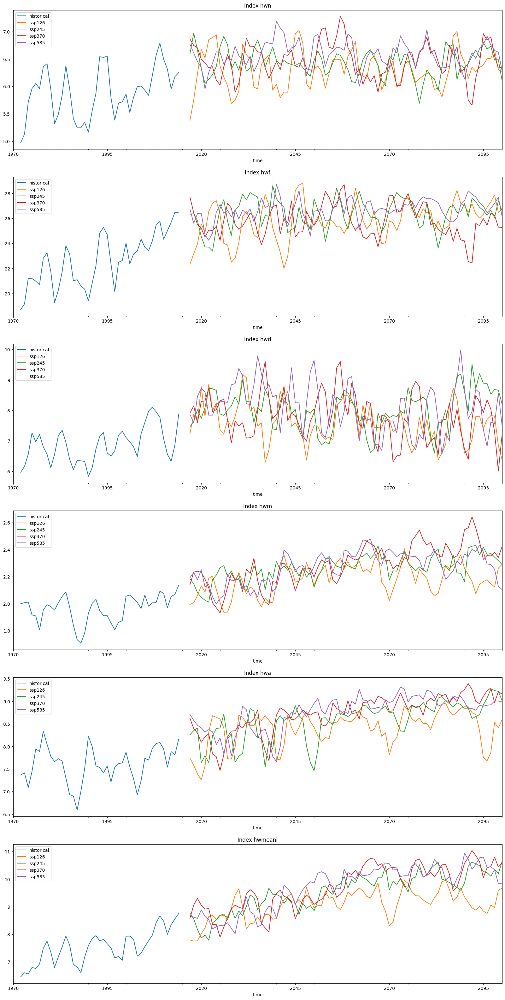

In [17]:
model = "EC-Earth3"
scenarios_prediction = models_predicted_yearly[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        df.rolling(3).mean().plot(y=index, ax=axs[i], label=scenario)
    axs[i].set_title(f"Index {index}")

### Prediction of ensemble mean model

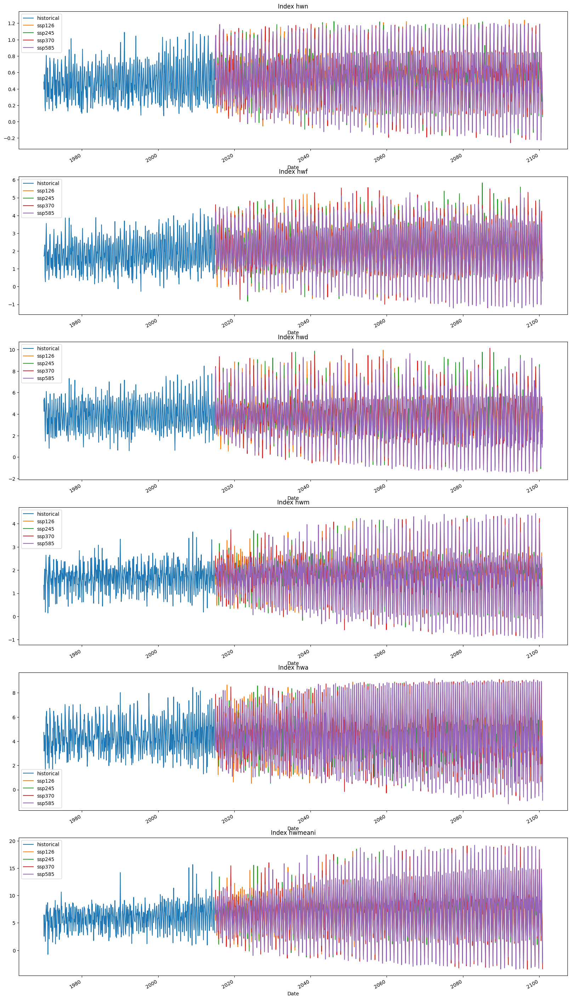

In [18]:
model = "ensemble_mean"
scenarios_prediction = models_scenario_predicted[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        df.plot(y=index, ax=axs[i], label=scenario)
    axs[i].set_title(f"Index {index}")

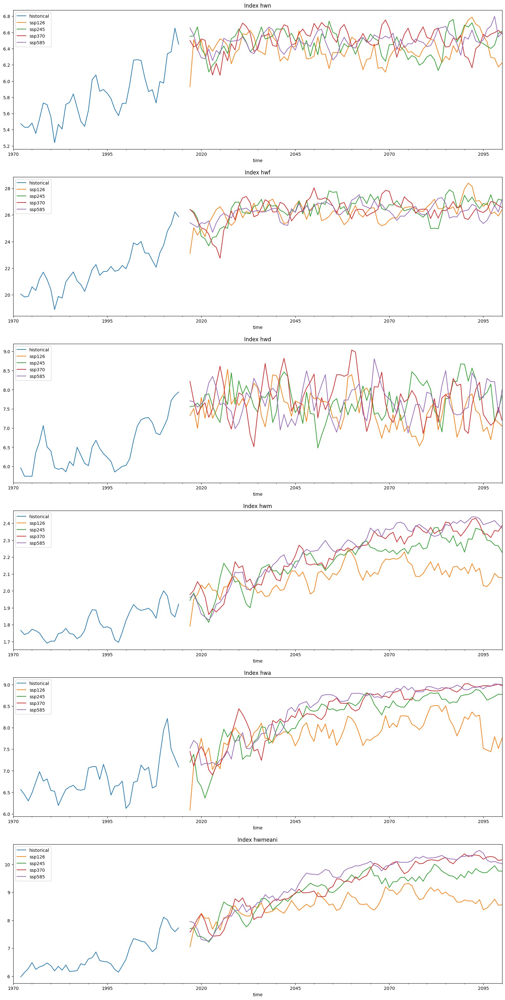

In [19]:
model = "ensemble_mean"
scenarios_prediction = models_predicted_yearly[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        df.rolling(3).mean().plot(y=index, ax=axs[i], label=scenario)
    axs[i].set_title(f"Index {index}")

### Mean of predicted Models

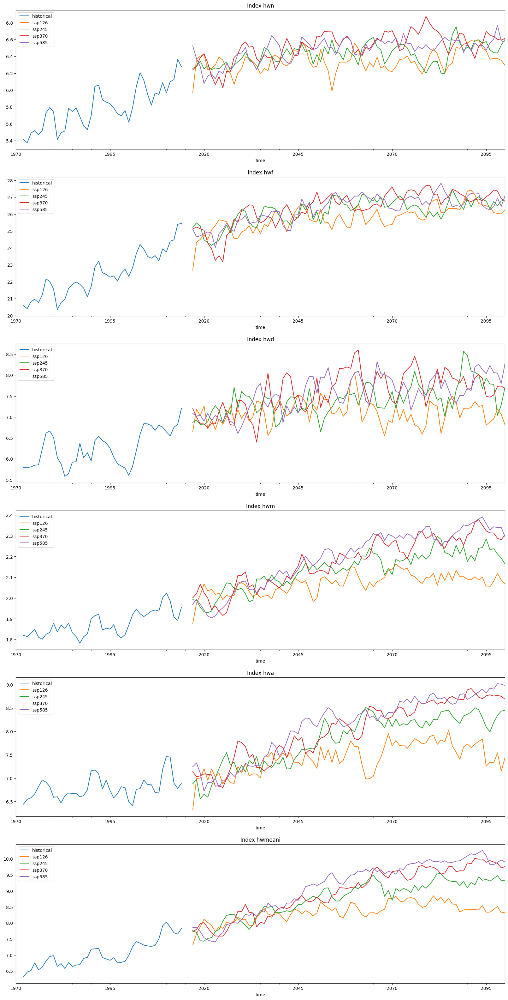

In [20]:
model = "mean"
scenarios_prediction = models_predicted_yearly[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        df.rolling(3).mean().plot(y=index, ax=axs[i], label=scenario)
    axs[i].set_title(f"Index {index}")

## Baseline Comparison

### EC-Earth3

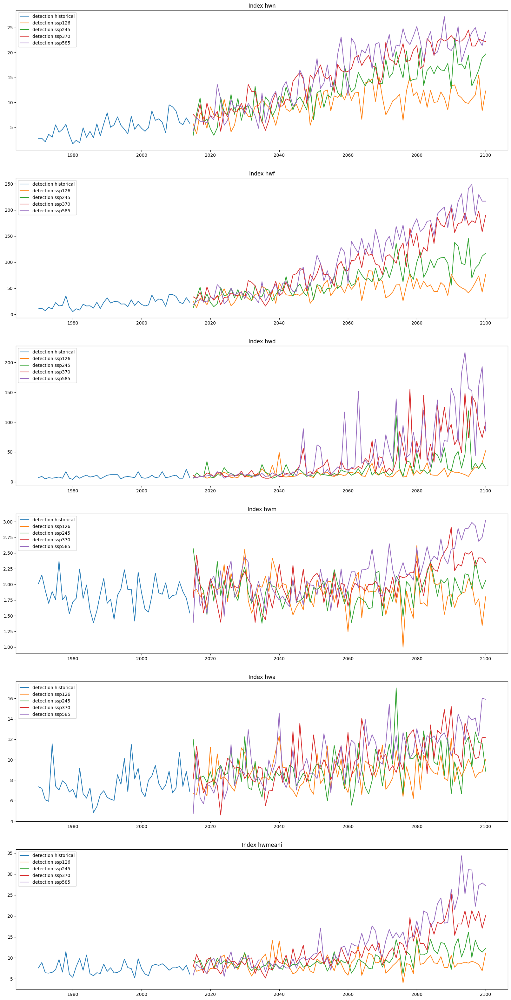

In [21]:
model = "EC-Earth3"
scenarios_prediction = models_predicted_yearly[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        axs[i].plot(df.index, hws_chile_model_scenario_yearly[model][scenario][index].values, label=f"detection {scenario}")
    axs[i].set_title(f"Index {index}")
    axs[i].legend()

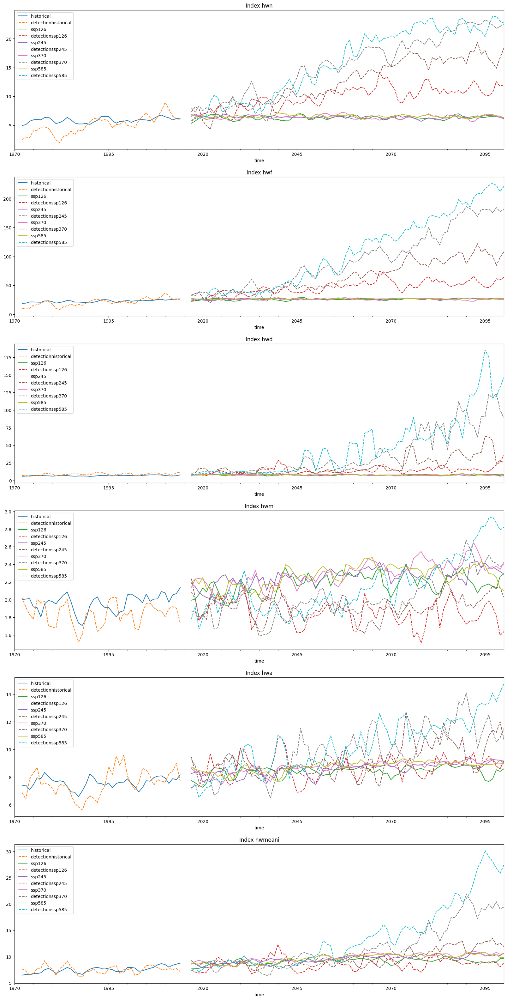

In [44]:
model = "EC-Earth3"
scenarios_prediction = models_predicted_yearly[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        df.rolling(3).mean().plot(y=index, ax=axs[i], label=scenario)
        values = hws_chile_model_scenario_yearly[model][scenario][index].values
        new_df = pd.DataFrame(values, columns=[index], index=df.index)
        # axs[i].plot(df.index, values, label=f"detection {scenario}")
        new_df.rolling(3).mean().plot(y=index, ax=axs[i], label=f"detection{scenario}", linestyle="--")
    axs[i].set_title(f"Index {index}")
    axs[i].legend()

### MIROC6

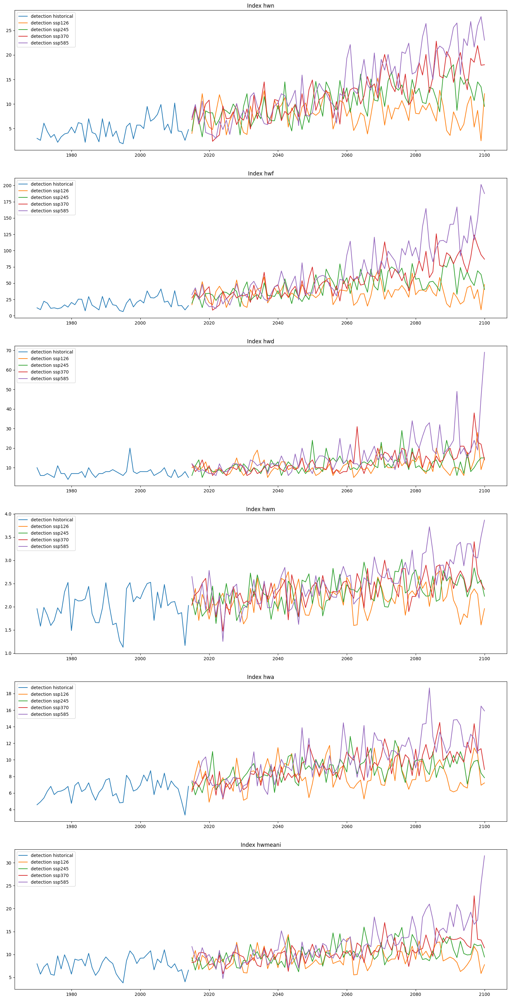

In [45]:
model = "MIROC6"
scenarios_prediction = models_predicted_yearly[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        axs[i].plot(df.index, hws_chile_model_scenario_yearly[model][scenario][index].values, label=f"detection {scenario}")
    axs[i].set_title(f"Index {index}")
    axs[i].legend()

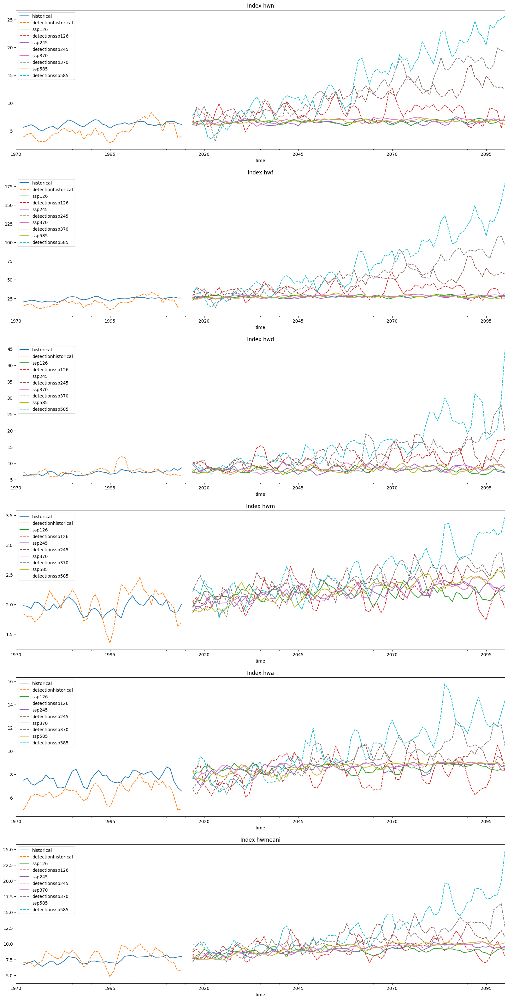

In [46]:
model = "MIROC6"
scenarios_prediction = models_predicted_yearly[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        df.rolling(3).mean().plot(y=index, ax=axs[i], label=scenario)
        values = hws_chile_model_scenario_yearly[model][scenario][index].values
        new_df = pd.DataFrame(values, columns=[index], index=df.index)
        # axs[i].plot(df.index, values, label=f"detection {scenario}")
        new_df.rolling(3).mean().plot(y=index, ax=axs[i], label=f"detection{scenario}", linestyle="--")
    axs[i].set_title(f"Index {index}")
    axs[i].legend()

### Mean Predictions vs Mean Detection

In [55]:
hw_mean_scenario = {}
models = list(hws_chile_model_scenario_yearly.keys())
for scenario in scenarios:
    
    all_models = pd.concat([hws_chile_model_scenario_yearly[model][scenario] for model in models], axis=1)
    df_mean_scenario = pd.DataFrame(columns=indices, index=hws_chile_model_scenario_yearly["EC-Earth3"][scenario].index)
    for index in indices:
        df_mean_scenario[index] = all_models[index].mean(axis=1)

    hw_mean_scenario[scenario] = df_mean_scenario

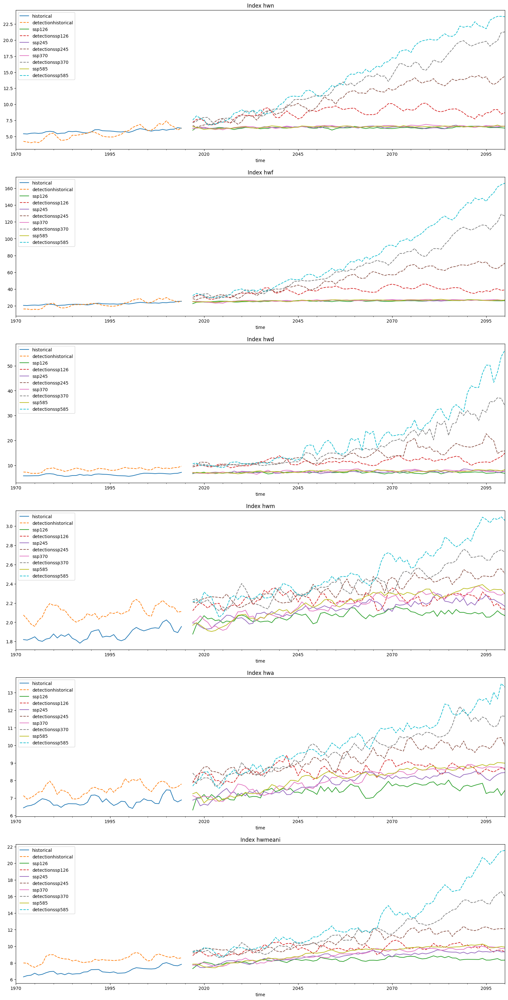

In [56]:
model = "mean"
scenarios_prediction = models_predicted_yearly[model]
fig, axs = plt.subplots(len(indices_of_interest), figsize=(20, 40))
for i, index in enumerate(indices_of_interest):
    for scenario, df in scenarios_prediction.items():
        df.rolling(3).mean().plot(y=index, ax=axs[i], label=scenario)
        values = hw_mean_scenario[scenario][index].values
        new_df = pd.DataFrame(values, columns=[index], index=df.index)
        # axs[i].plot(df.index, values, label=f"detection {scenario}")
        new_df.rolling(3).mean().plot(y=index, ax=axs[i], label=f"detection{scenario}", linestyle="--")
    axs[i].set_title(f"Index {index}")
    axs[i].legend()

### Mathematical Validation

In [ ]:
def compare_relationships(models_dict):
    """
    Compare mathematical relationships between heatwave indices for each model.

    Parameters
    ----------
    models_dict : dict
        Dictionary of {model_name: dataframe} containing indices.

    Returns
    -------
    dict
        Dictionary {model_name: dataframe} with comparison results.
    """
    tol = 1e-6

    results = {model : {} for model in models_dict.keys()}

    for model, dict in models_dict.items():
        for scenario, df in dict.items():
            comp_df = pd.DataFrame(index=df.index)

            # Expected values
            exp_hwanom = df["hwm"] * df["hwf"]
            exp_hwmd   = df["hwf"] / df["hwn"]
            exp_hwmi   = df["hwd"] * df["hwa"]

            # Relative differences
            comp_df["rel_diff_hwanom"] = (df["hwanom"] - exp_hwanom) / (exp_hwanom + tol)
            comp_df["rel_diff_hwmd"]   = (df["hwmd"]   - exp_hwmd)   / (exp_hwmd   + tol)
            comp_df["rel_diff_hwmi"]   = (df["hwmi"]   - exp_hwmi)   / (exp_hwmi   + tol)

            # Inequalities → booleans
            comp_df["hwd_ge_hwmd"] = df["hwd"] >= df["hwmd"]
            comp_df["hwa_ge_hwm"]  = df["hwa"] >= df["hwm"]
            results[model][scenario] = comp_df

    return results


In [ ]:
yearly_checks = compare_relationships(models_predicted_yearly)

KeyError: 'hwanom'

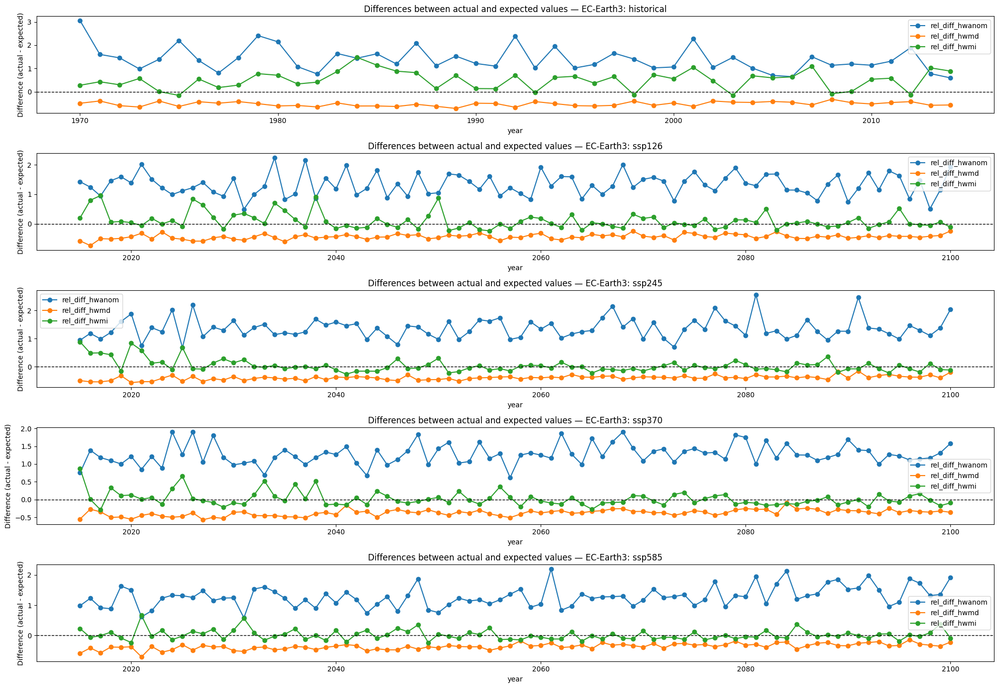

In [ ]:
import matplotlib.pyplot as plt

def plot_differences(model_name, checks_dict):

    fig, ax = plt.subplots(len(scenarios), figsize=(20, 15))
    for i,scenario in enumerate(scenarios):
        df = checks_dict[model_name][scenario]
        df[["rel_diff_hwanom", "rel_diff_hwmd", "rel_diff_hwmi"]].plot(ax=ax[i], marker="o")
        ax[i].axhline(0, color="black", linestyle="--", linewidth=1)
        ax[i].set_title(f"Differences between actual and expected values — {model_name}: {scenario}")
        ax[i].set_ylabel("Difference (actual - expected)")
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # otherwise the right y-label is slightly clipped
    plt.show()

# Example: yearly
plot_differences("EC-Earth3", yearly_checks)


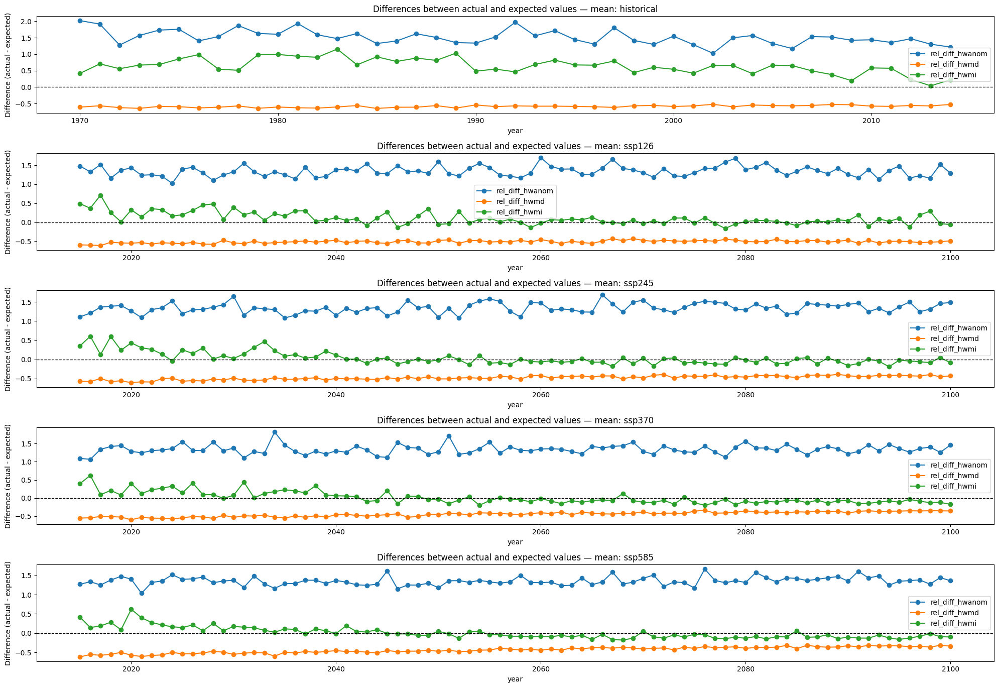

In [ ]:
plot_differences("mean", yearly_checks)


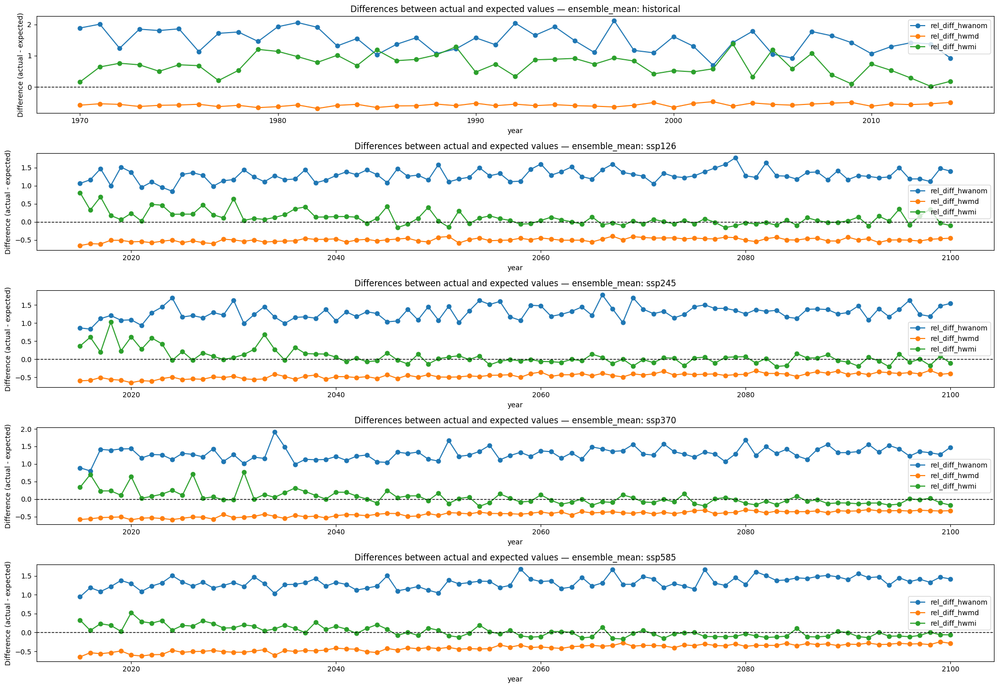

In [ ]:
plot_differences("ensemble_mean", yearly_checks)


## Notes

- Missing to include datasets detection (ERA5 for historical + CMIP6 grid detection), this to compare as baseline against our models.

- For now, appears that hwn and hwd are the indices that better adjust to the intuition of the difference of the scenarios. We see only in these indices that the pessimistic scenarios actually give higher indices than the optimistic scenarios. For our luck, hwn is a frequency index and hwd an intensity index. Also we can see in hwa that there is an increasing trend, but it is not very different across each scenario. Again, here is why it is necessary to include the baseline of grid detection, to see if that detection visualize the difference between scenarios aswell.

- Include new heatwaves indices that have logical relationship with each other. So we can check mathematical consistency between them after prediction.
